# Deployed by Nandini Lokesh Reddy

In [1]:
!nvidia-smi

Thu Jun 13 15:20:03 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
!pip install matplotlib
!pip install scikit-image
!pip install glob
!pip install keras


ERROR: Could not find a version that satisfies the requirement glob (from versions: none)
ERROR: No matching distribution found for glob


In [2]:
!pip install imageio

In [3]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
import imageio
import glob
import os

In [4]:
t1_path = "/content/drive/MyDrive/dataset/Tr1/TrainT1"
t2_path = "/content/drive/MyDrive/dataset/Tr2/TrainT2"

t1_images = os.listdir(t1_path)
t2_images = os.listdir(t2_path)

In [5]:
def extract_images(ospath, imgfolder):
    img_list = []
    for file in imgfolder:
        img = imageio.imread(ospath+ '/' + file)
        img_list.append(img)
    return np.asarray(img_list)

In [6]:
t1 = extract_images(t1_path, t1_images)
t2 = extract_images(t2_path, t2_images)
print('T1 Shape: ',t1.shape)
print('T2 Shape: ',t2.shape)
print('Dataset size: ', t1.shape[0]+t2.shape[0])

<ipython-input-5-15953ab28dc3>:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(ospath+ '/' + file)


T1 Shape:  (43, 217, 181)
T2 Shape:  (46, 217, 181)
Dataset size:  89


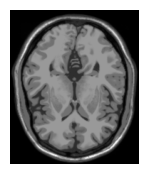

In [7]:
plt.figure(figsize=(2, 2))
plt.imshow(t1[2], cmap='gray')
plt.axis('off')
plt.show()

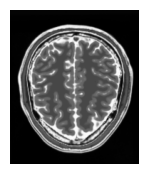

In [8]:
plt.figure(figsize=(2, 2))
plt.imshow(t2[2], cmap='gray')
plt.axis('off')
plt.show()

# PREPROCESSING

In [9]:
def normalize(img):
    img = (img/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
    return img

In [10]:
t1 = normalize(t1)
t2 = normalize(t2)

In [12]:
def resize_img(imgs):
    img_resized = np.zeros((imgs.shape[0], 64, 64))
    for index, img in enumerate(imgs):
        img_resized[index, :, :] = resize(img, (64, 64))
    return img_resized

In [13]:
t1_resized = resize_img(t1)
t2_resized = resize_img(t2)
print('T1 Shape: ',t1_resized.shape)
print('T2 Shape: ',t2_resized.shape)

T1 Shape:  (43, 64, 64)
T2 Shape:  (46, 64, 64)


In [14]:
t1_resized = t1_resized.reshape(t1_resized.shape[0], 64, 64, 1).astype('float32')
t2_resized = t2_resized.reshape(t2_resized.shape[0], 64, 64, 1).astype('float32')

In [15]:
BATCH_SIZE = 32
t1_resized = tf.data.Dataset.from_tensor_slices(t1_resized).shuffle(t1.shape[0], seed=42).batch(BATCH_SIZE)
t2_resized = tf.data.Dataset.from_tensor_slices(t2_resized).shuffle(t2.shape[0], seed=42).batch(BATCH_SIZE)

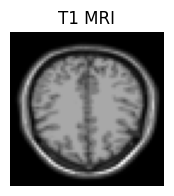

In [16]:
t1_sample = next(iter(t1_resized))
plt.figure(figsize=(2, 2))
plt.imshow(t1_sample[0].numpy()[:, :, 0], cmap='gray')
plt.title('T1 MRI')
plt.axis('off')
plt.show()

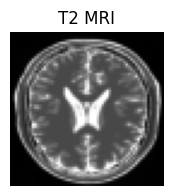

In [17]:
t2_sample = next(iter(t2_resized))
plt.figure(figsize=(2, 2))
plt.imshow(t2_sample[0].numpy()[:, :, 0], cmap='gray')
plt.title('T2 MRI')
plt.axis('off')
plt.show()

# MODEL BUILDING AND TRAINING

In [18]:
# Class to implement instant normalization on images
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

In [19]:
# Downsampling method: Leads to reduction in dimensions, achieved with convolutions
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [20]:
# Upsampling method: Achieved with Conv2DTranspose
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

In [21]:
# Unet Generator: A combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(128, 4, False), # (bs, 32, 32, 128)
        downsample(256, 4), # (bs, 16, 16, 256)
        downsample(256, 4), # (bs, 8, 8, 256)
        downsample(256, 4), # (bs, 4, 4, 256)
        downsample(256, 4), # (bs, 2, 2, 256)
        downsample(256, 4) # (bs, 1, 1, 256)
    ]
    up_stack = [
        upsample(256, 4, True), # (bs, 2, 2, 256)
        upsample(256, 4, True), # (bs, 4, 4, 256)
        upsample(256, 4), #(bs, 8, 8, 256)
        upsample(256, 4),# (bs, 16, 16, 256)
        upsample(128, 4) # (bs, 32, 32, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 64, 64, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[64, 64, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

# GENERATOR

In [22]:
generator_g = unet_generator()
generator_f = unet_generator()

In [23]:
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 sequential (Sequential)     (None, 32, 32, 128)          2048      ['input_1[0][0]']             
                                                                                                  
 sequential_1 (Sequential)   (None, 16, 16, 256)          524800    ['sequential[0][0]']          
                                                                                                  
 sequential_2 (Sequential)   (None, 8, 8, 256)            1049088   ['sequential_1[0][0]']        
                                                                                              

# DISCRIMINATOR

In [24]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is used
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (64, 64, 1)
    inp = tf.keras.layers.Input(shape=[64, 64, 1], name='input_image')
    x = inp

    # add downsampling step here
    down1 = downsample(128, 4, False)(x) # (bs, 32, 32, 128)
    down2 = downsample(256, 4)(down1) # (bs, 16, 16, 128)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2) # (bs, 18, 18, 256)

    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 15, 15, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 17, 17, 512)

    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 14, 14, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [25]:
discriminator_x = discriminator()
discriminator_y = discriminator()

In [26]:
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 64, 64, 1)]       0         
                                                                 
 sequential_22 (Sequential)  (None, 32, 32, 128)       2048      
                                                                 
 sequential_23 (Sequential)  (None, 16, 16, 256)       524800    
                                                                 
 zero_padding2d (ZeroPaddin  (None, 18, 18, 256)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 15, 15, 512)       2097152   
                                                                 
 instance_normalization_21   (None, 15, 15, 512)       1024      
 (InstanceNormalization)                                   

# TRAINING

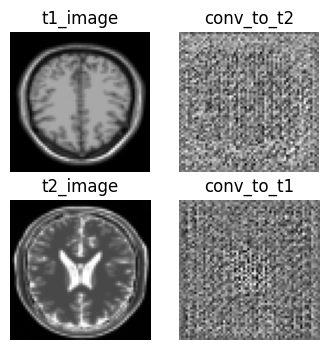

In [27]:
# Verify output of untrained Generator models which should be a random noise
conv_to_t2 = generator_g(t1_sample)
conv_to_t1 = generator_f(t2_sample)
plt.figure(figsize=(4, 4))

imgs = [t1_sample, conv_to_t2, t2_sample, conv_to_t1]
title = ['t1_image', 'conv_to_t2', 't2_image', 'conv_to_t1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

In [28]:
# Classification loss of discriminator: BCE Loss
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [29]:
# Discriminator Loss: Real Loss + Fake Loss)
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [30]:
# Generator Loss: Discriminator loss on generated data
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [31]:
# Cycle Loss: When we use both of Generators sequentially on a Input Image, we get Cycle Image and
# the L1 Loss between these two is called Cycle Loss.
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

In [32]:
# Identity Loss: When we provide input image to the Generator such that no translation is needed
# because the image is already transformed, here also we take L1 Loss between Input and Output Image.
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

In [33]:
# Leveraging Adam Optimizer to smoothen gradient descent
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [40]:
# Training model for 250 epochs
EPOCHS = 250

In [41]:
# Initialize checkpoints to save models
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [42]:
# Definition to show generated output whilst training
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Generated Image', 'Input Image', 'Generated Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [43]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

In [44]:
# Verify if GPU is set as the default device for training
tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5



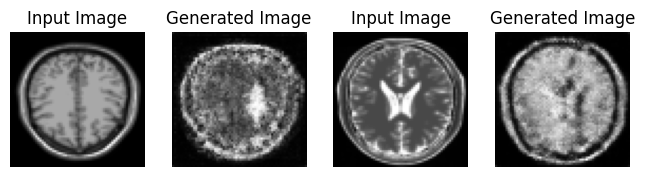

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-51


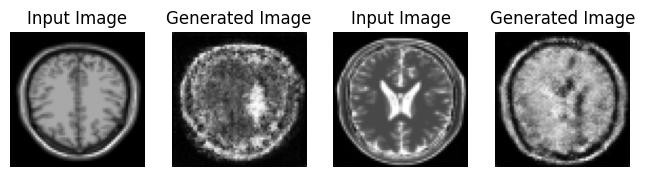

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-52


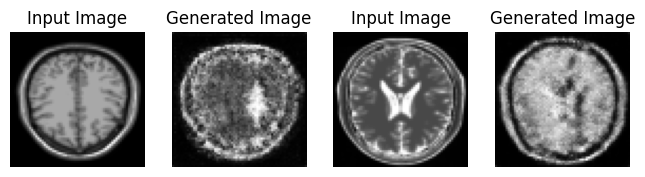

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-53


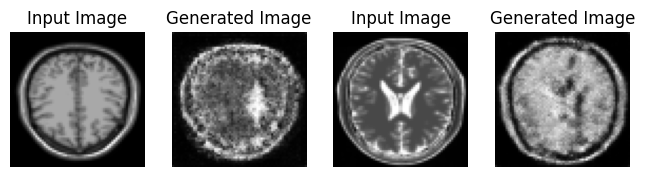

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-54


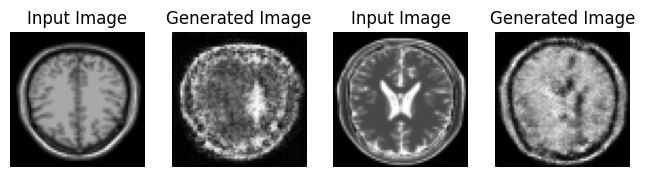

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-55


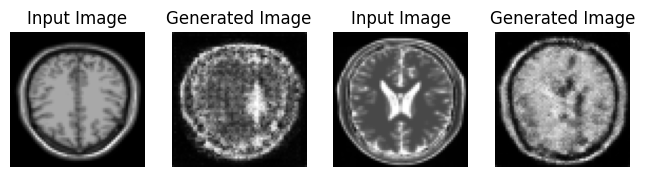

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-56


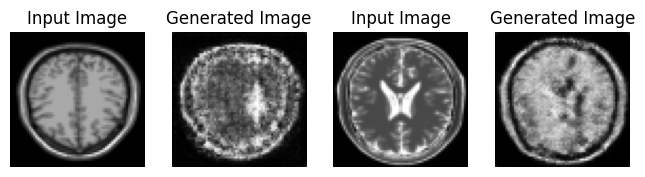

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-57


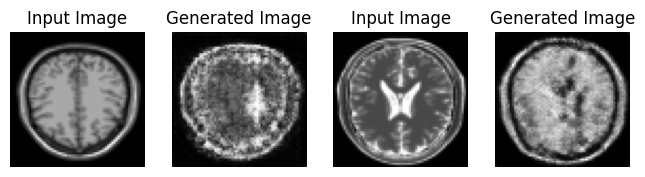

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-58


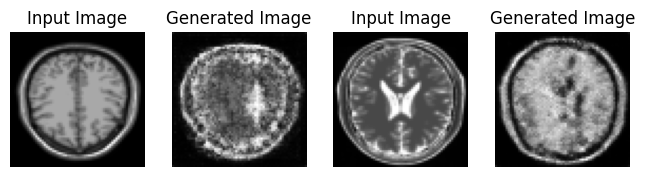

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-59


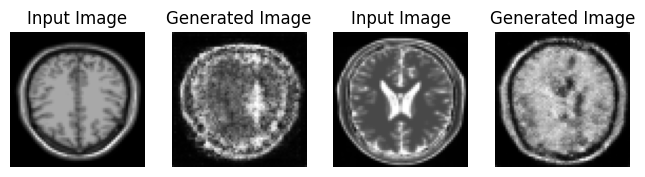

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-60


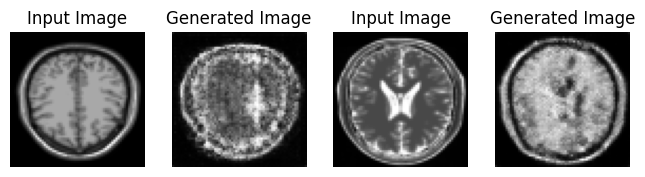

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-61


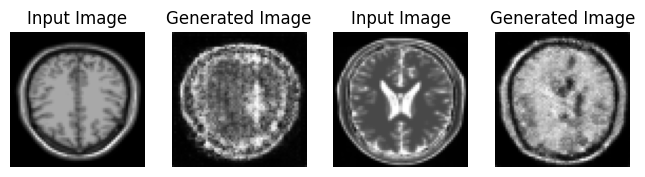

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-62


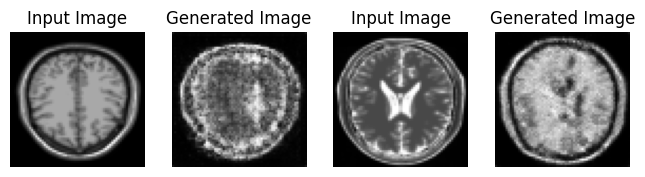

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-63


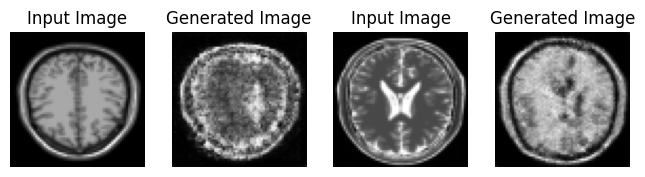

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-64


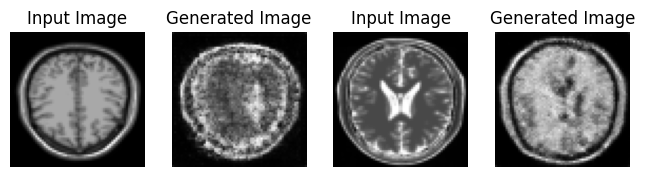

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-65


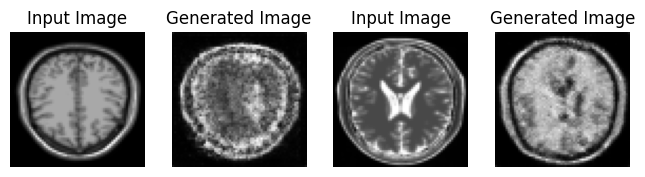

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-66


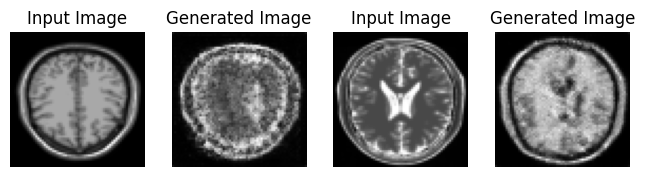

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-67


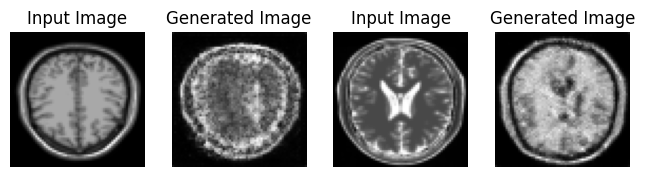

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-68


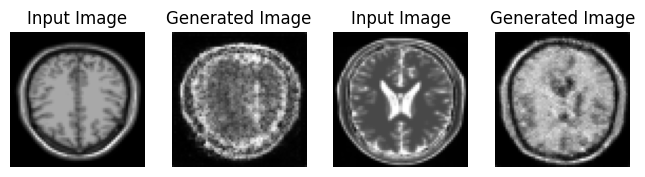

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-69


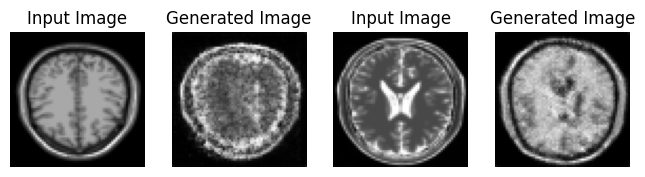

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-70


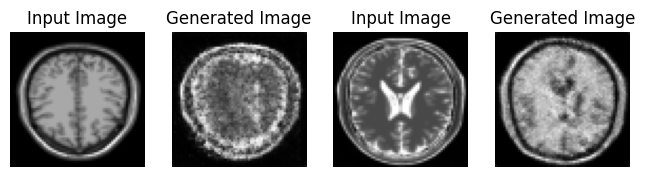

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-71


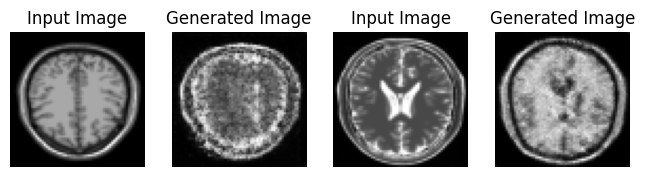

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-72


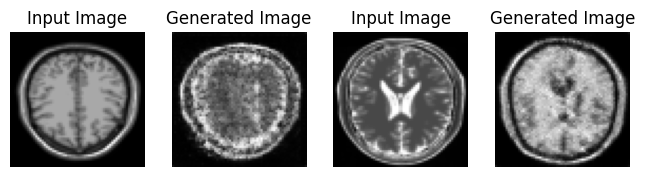

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-73


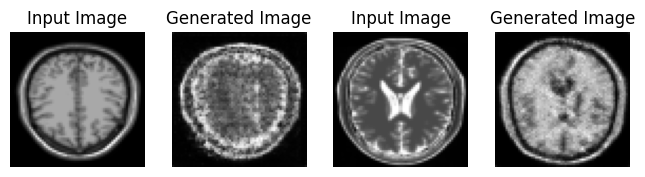

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-74


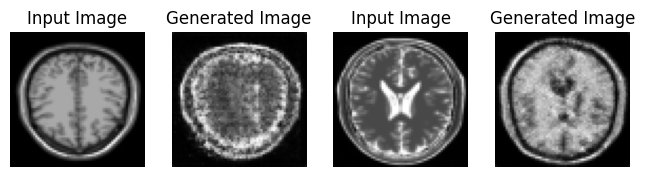

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-75


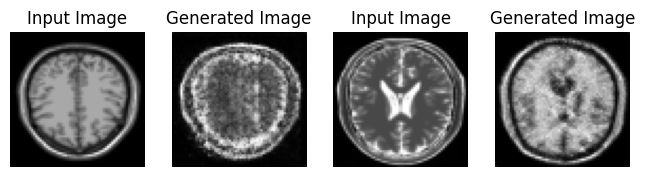

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-76


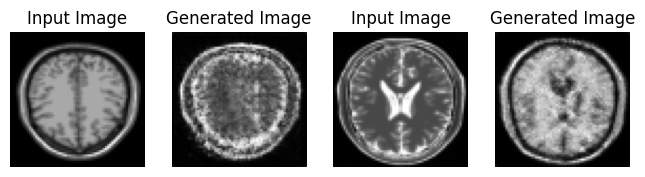

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-77


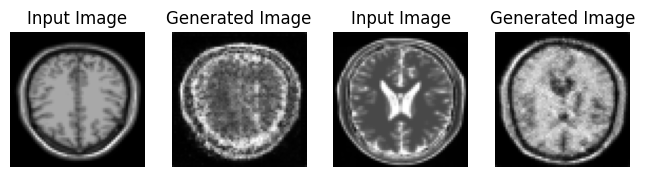

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-78


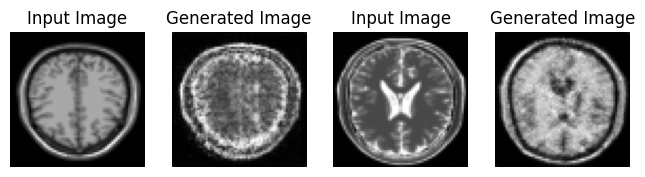

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-79


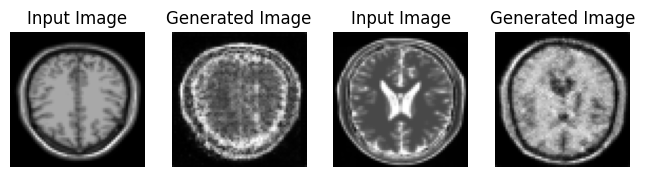

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-80


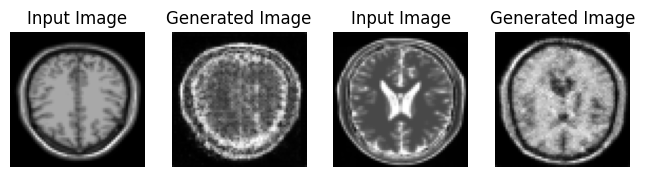

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-81


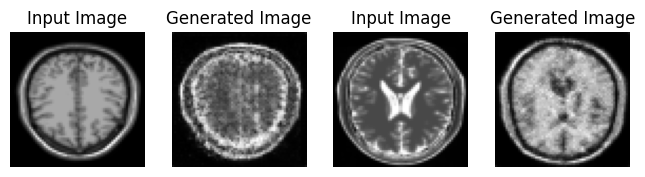

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-82


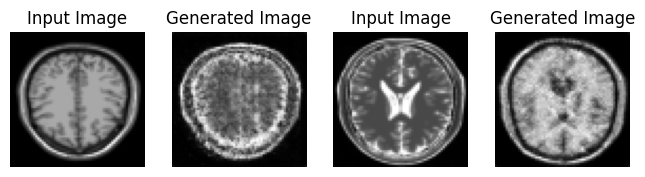

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-83


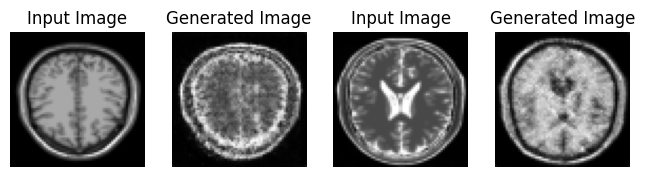

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-84


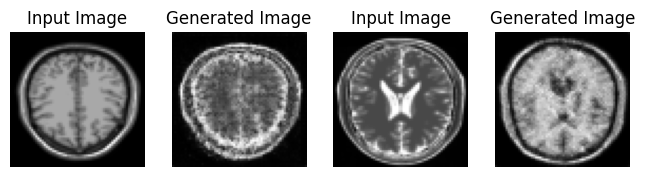

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-85


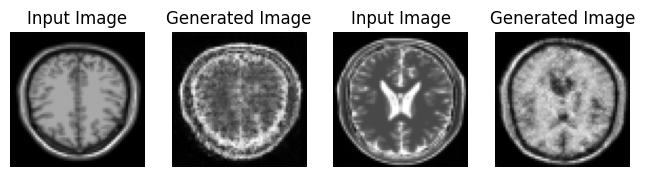

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-86


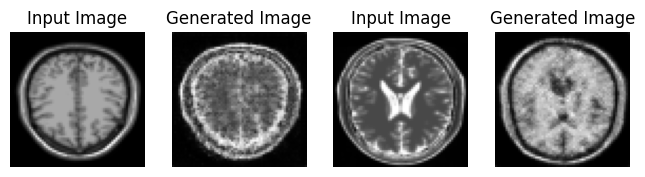

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-87


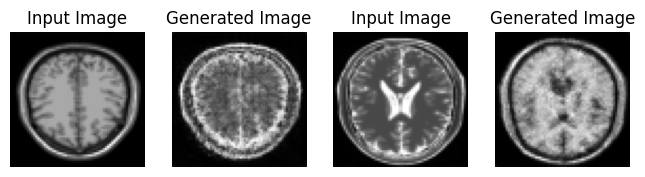

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-88


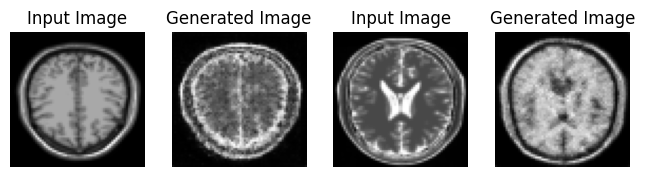

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-89


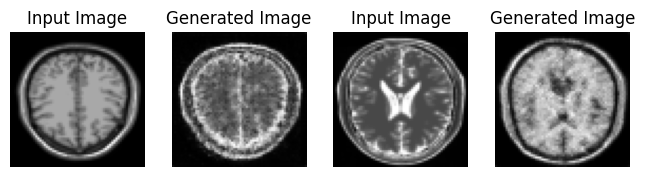

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-90


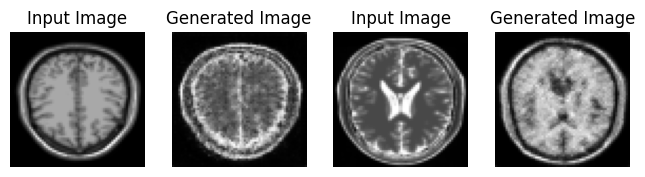

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-91


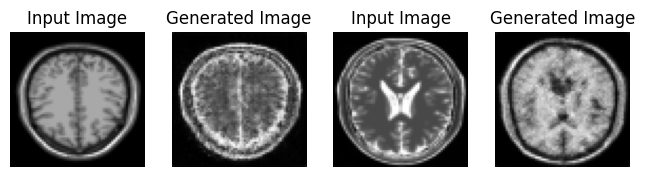

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-92


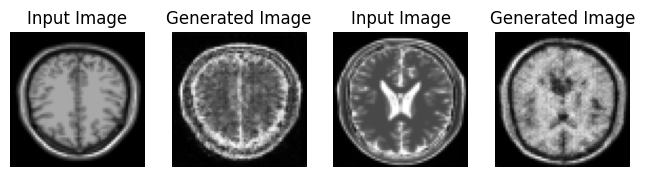

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-93


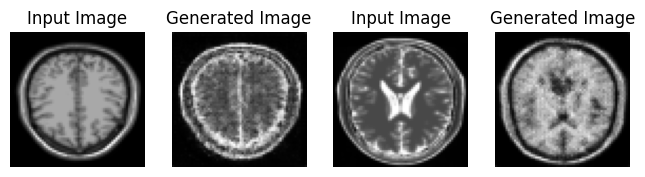

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-94


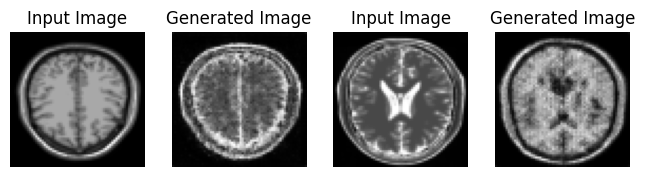

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-95


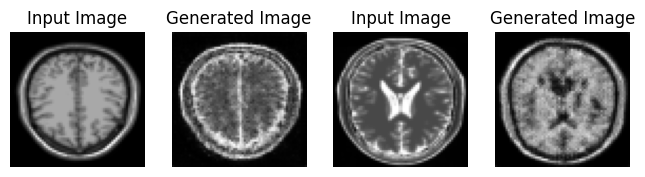

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-96


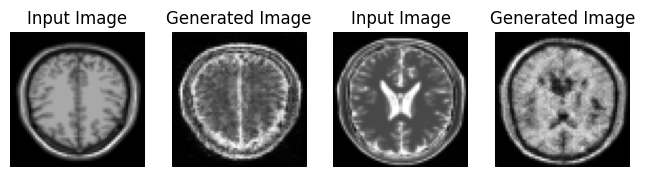

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-97


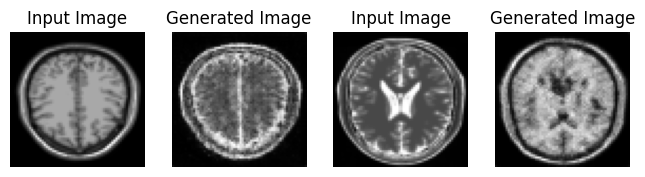

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-98


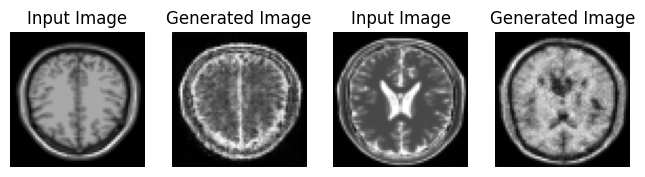

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-99


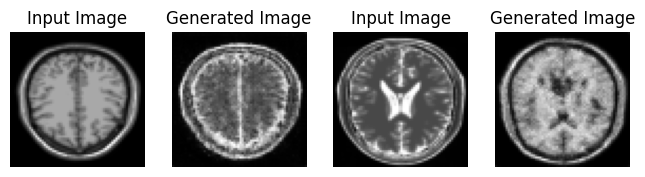

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-100


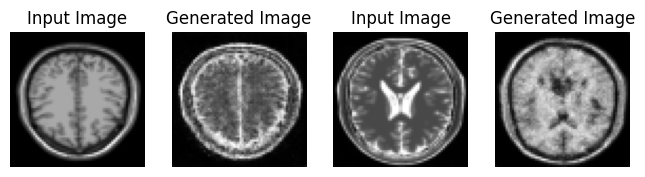

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-101


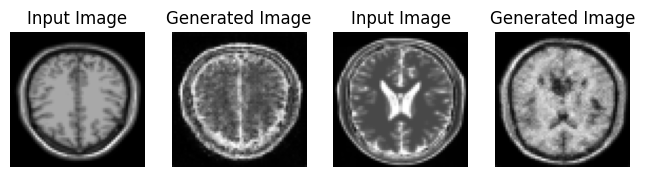

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-102


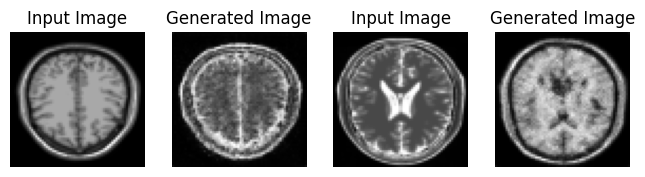

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-103


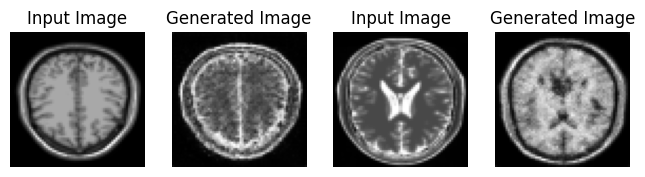

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-104


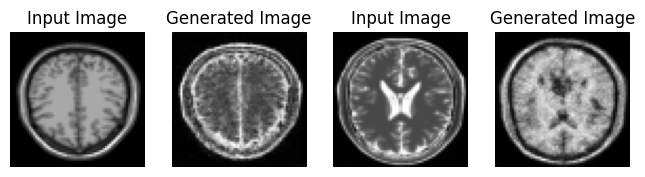

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-105


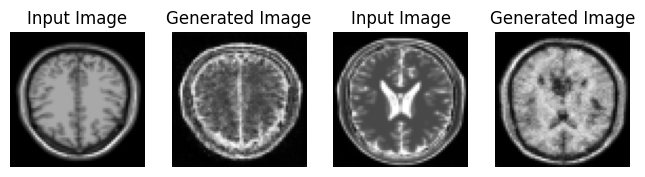

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-106


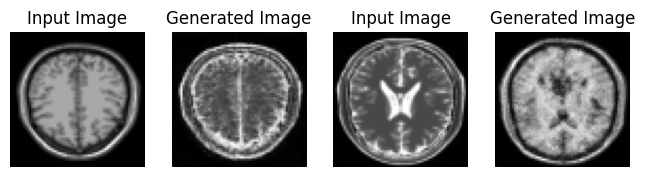

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-107


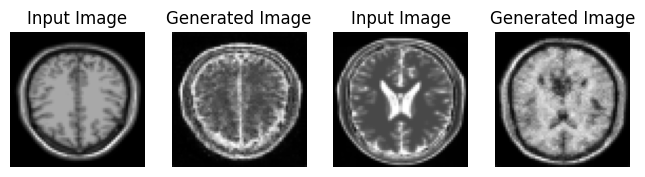

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-108


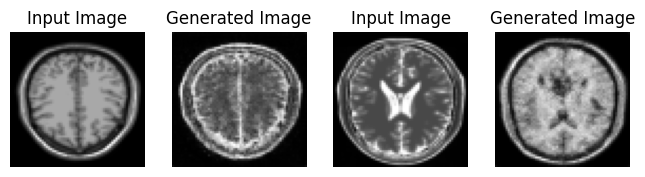

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-109


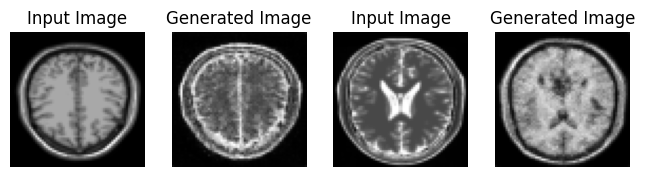

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-110


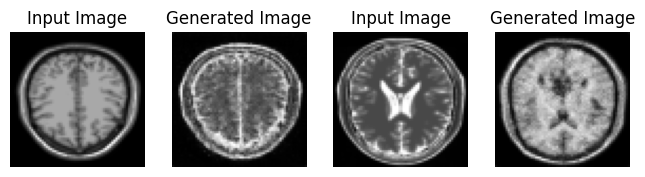

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-111


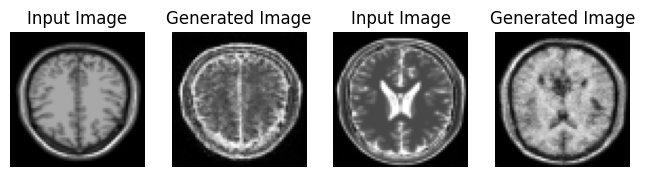

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-112


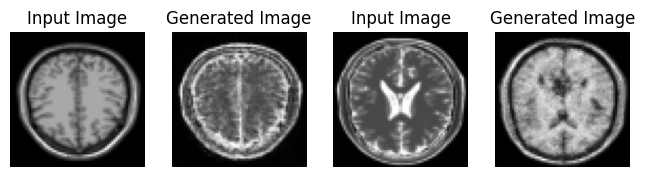

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-113


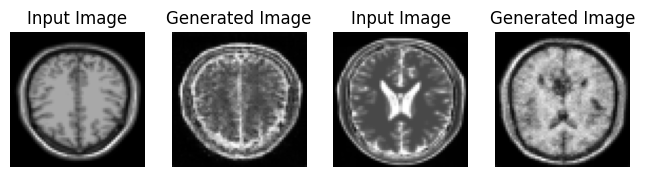

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-114


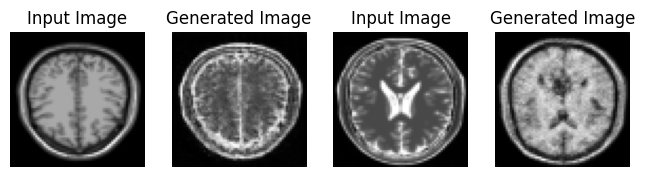

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-115


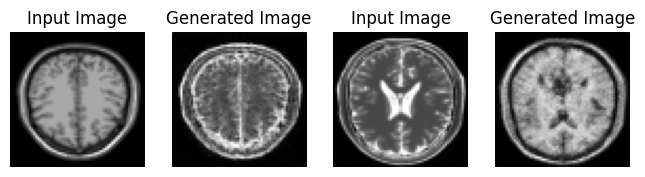

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-116


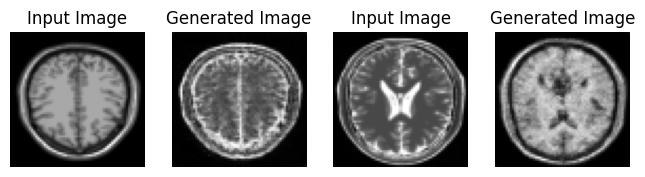

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-117


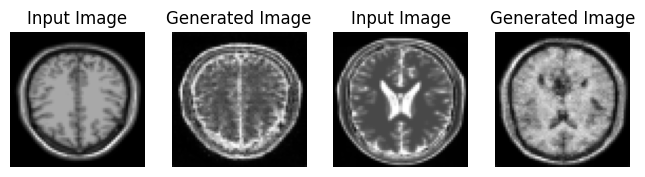

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-118


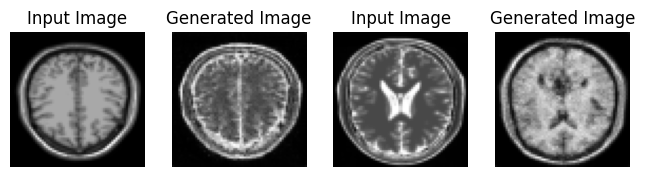

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-119


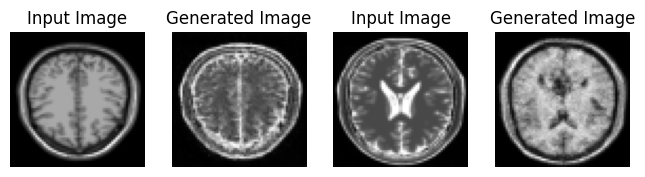

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-120


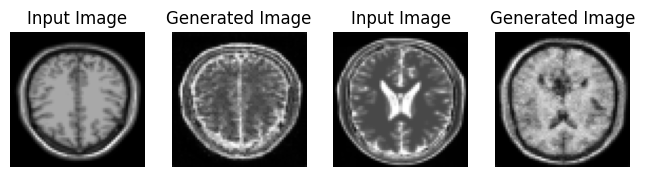

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-121


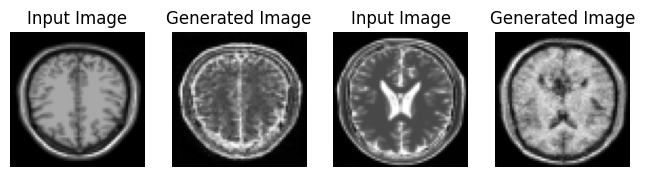

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-122


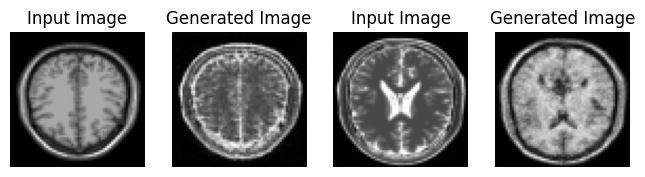

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-123


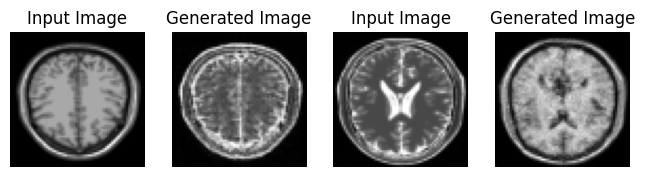

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-124


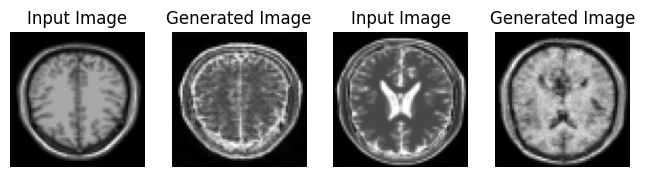

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-125


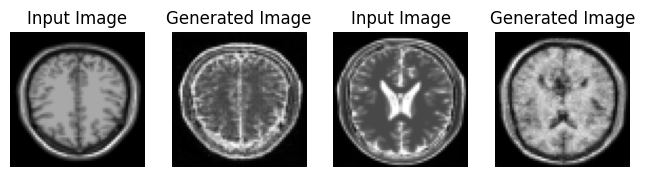

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-126


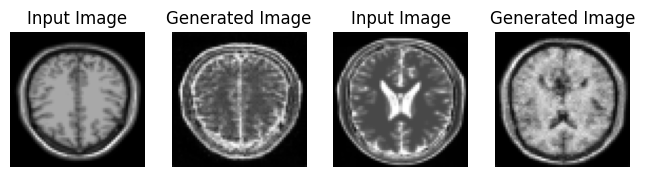

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-127


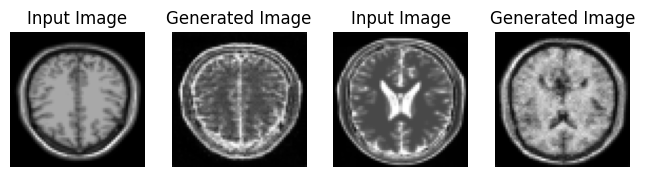

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-128


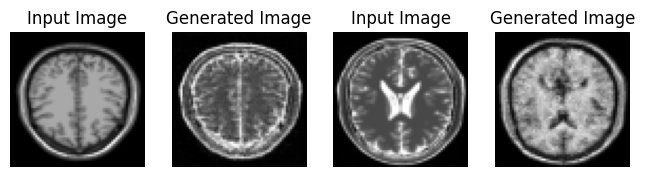

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-129


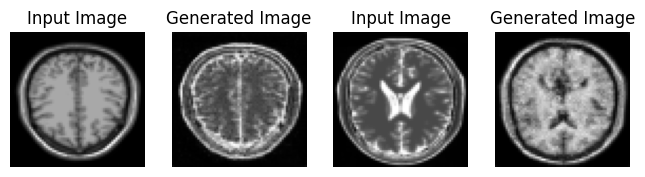

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-130


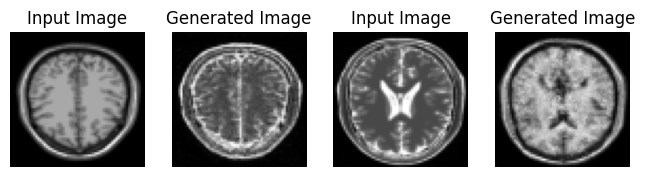

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-131


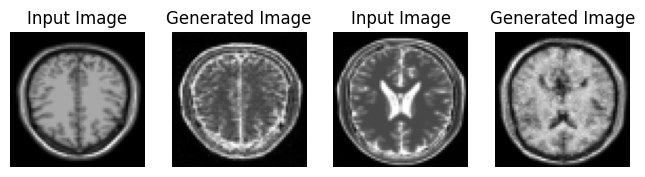

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-132


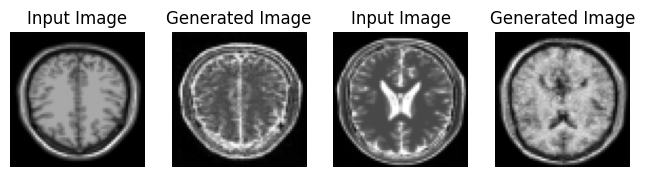

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-133


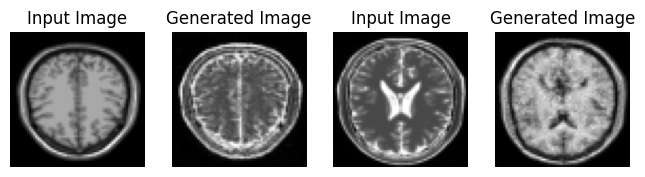

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-134


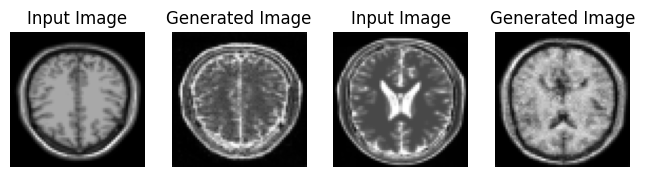

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-135


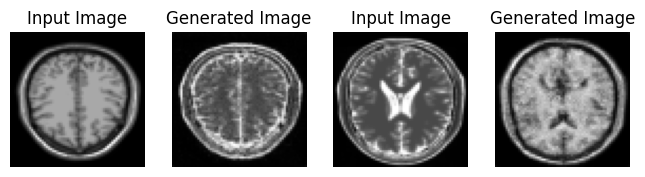

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-136


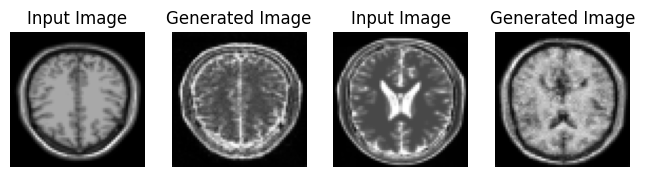

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-137


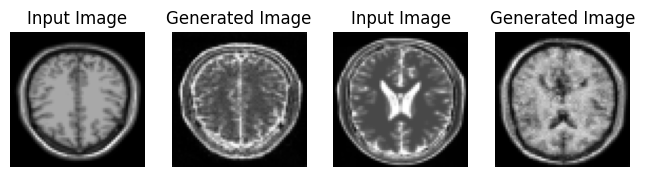

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-138


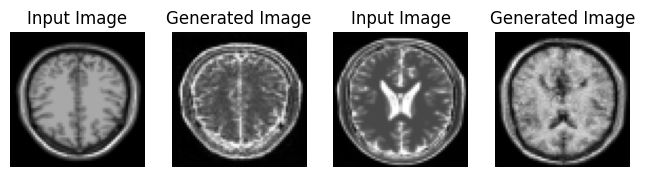

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-139


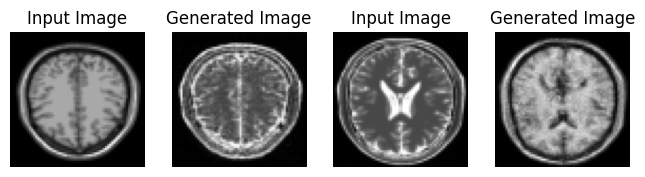

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-140


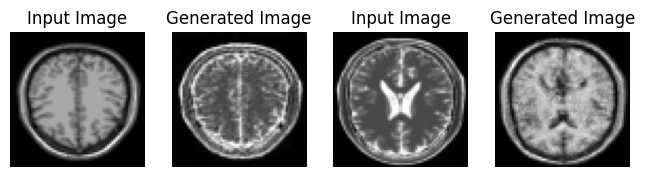

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-141


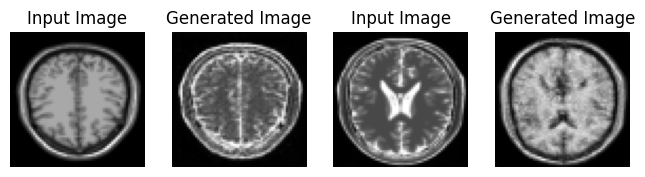

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-142


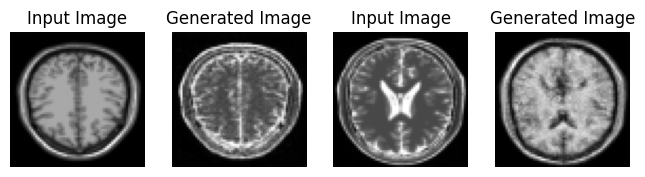

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-143


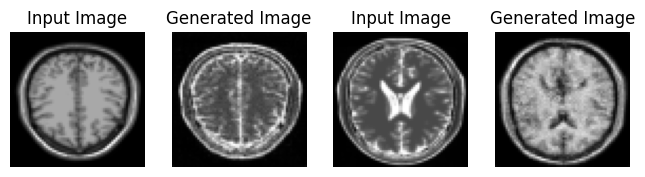

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-144


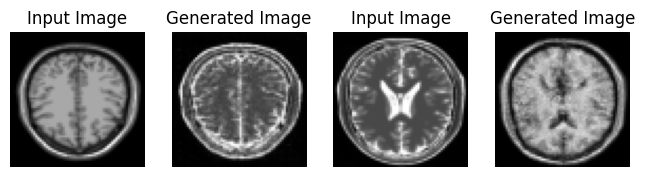

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-145


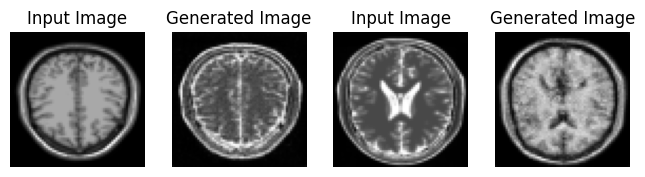

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-146


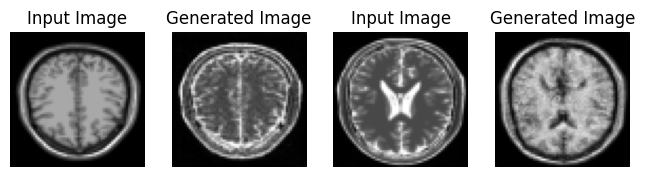

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-147


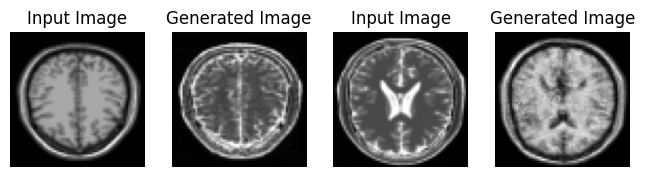

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-148


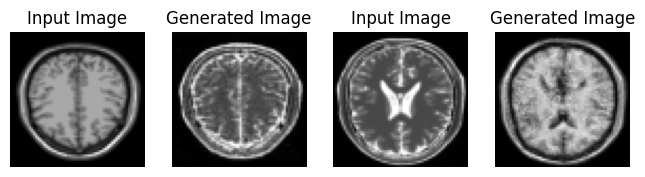

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-149


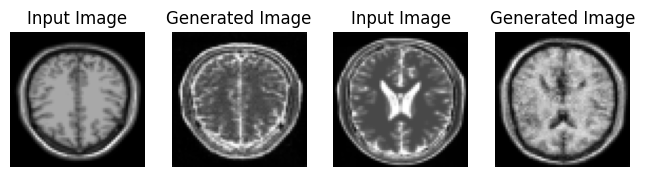

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-150


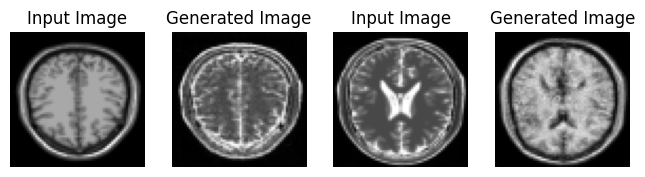

Saving checkpoint for epoch 101 at ./Trained_Model/ckpt-151


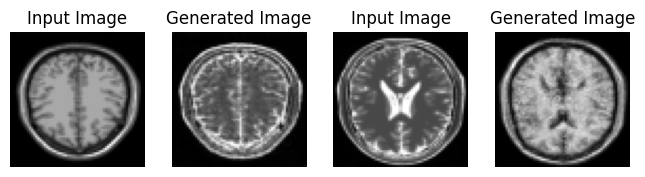

Saving checkpoint for epoch 102 at ./Trained_Model/ckpt-152


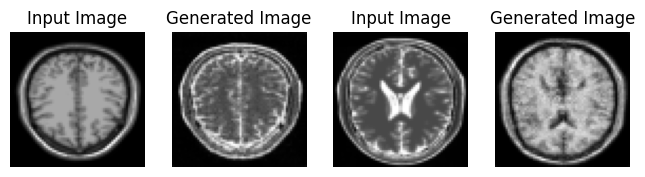

Saving checkpoint for epoch 103 at ./Trained_Model/ckpt-153


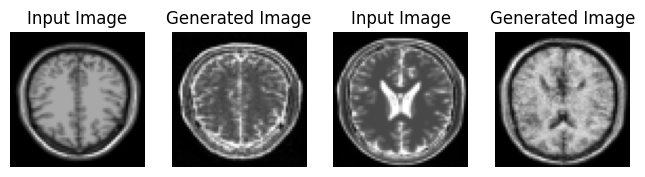

Saving checkpoint for epoch 104 at ./Trained_Model/ckpt-154


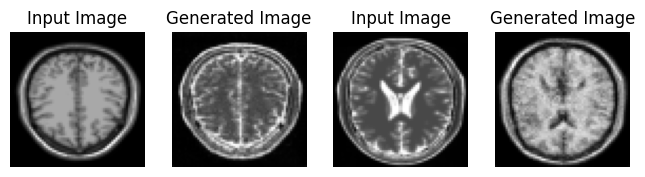

Saving checkpoint for epoch 105 at ./Trained_Model/ckpt-155


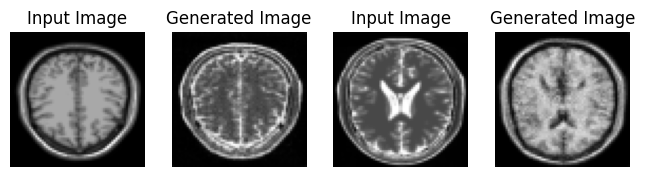

Saving checkpoint for epoch 106 at ./Trained_Model/ckpt-156


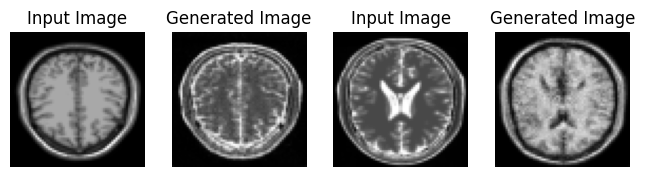

Saving checkpoint for epoch 107 at ./Trained_Model/ckpt-157


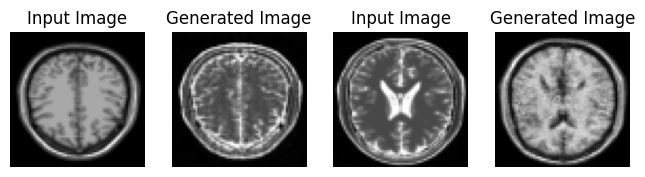

Saving checkpoint for epoch 108 at ./Trained_Model/ckpt-158


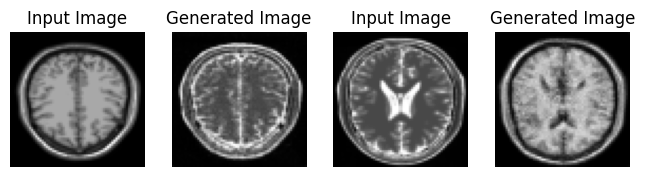

Saving checkpoint for epoch 109 at ./Trained_Model/ckpt-159


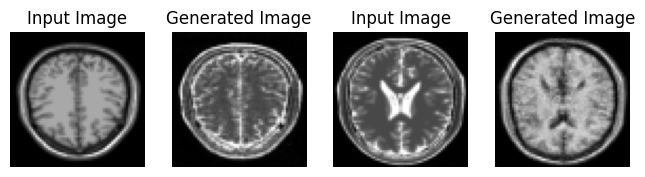

Saving checkpoint for epoch 110 at ./Trained_Model/ckpt-160


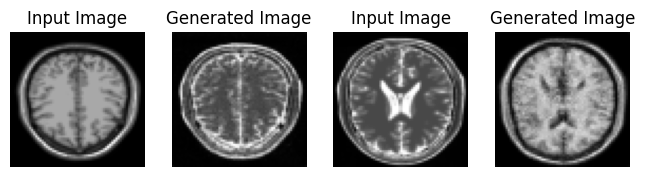

Saving checkpoint for epoch 111 at ./Trained_Model/ckpt-161


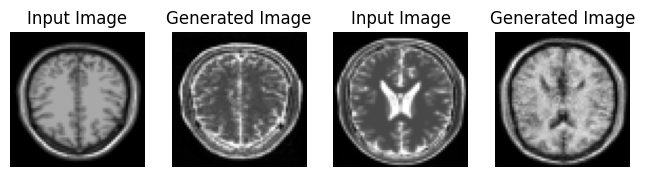

Saving checkpoint for epoch 112 at ./Trained_Model/ckpt-162


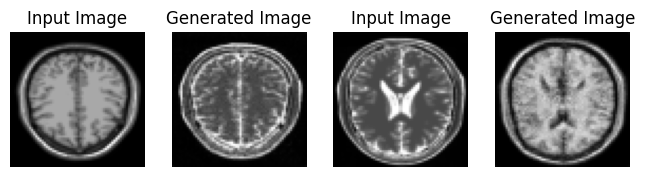

Saving checkpoint for epoch 113 at ./Trained_Model/ckpt-163


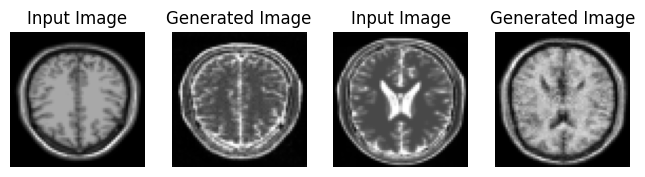

Saving checkpoint for epoch 114 at ./Trained_Model/ckpt-164


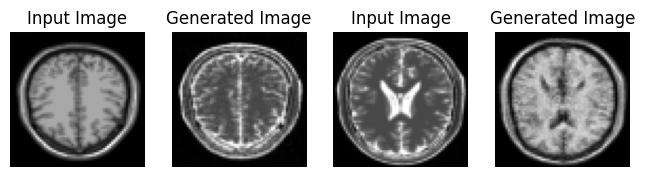

Saving checkpoint for epoch 115 at ./Trained_Model/ckpt-165


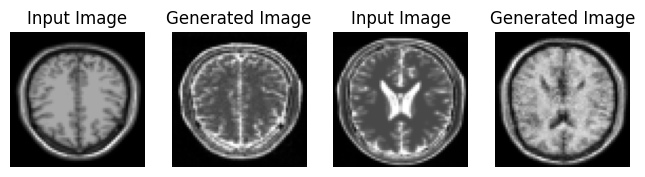

Saving checkpoint for epoch 116 at ./Trained_Model/ckpt-166


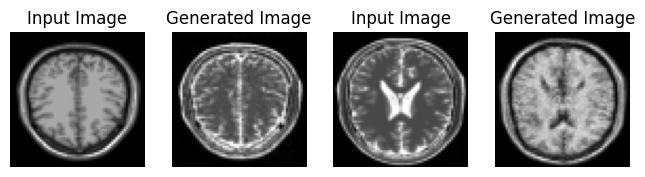

Saving checkpoint for epoch 117 at ./Trained_Model/ckpt-167


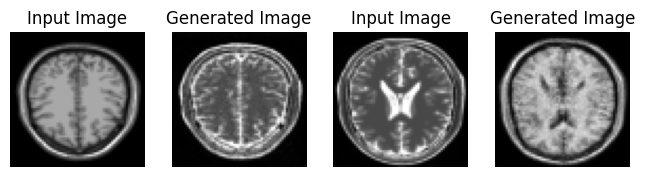

Saving checkpoint for epoch 118 at ./Trained_Model/ckpt-168


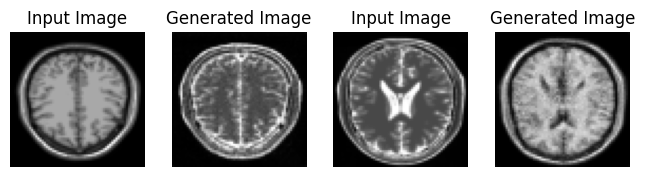

Saving checkpoint for epoch 119 at ./Trained_Model/ckpt-169


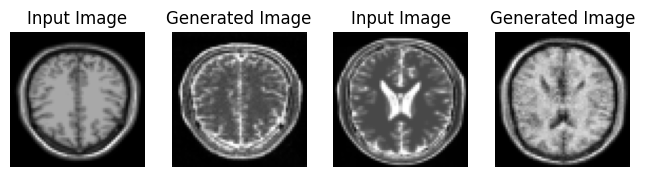

Saving checkpoint for epoch 120 at ./Trained_Model/ckpt-170


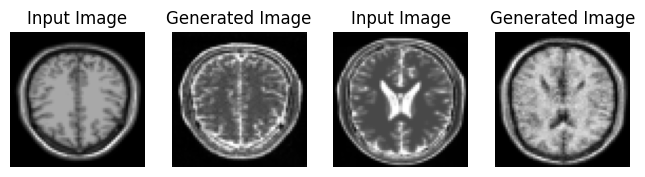

Saving checkpoint for epoch 121 at ./Trained_Model/ckpt-171


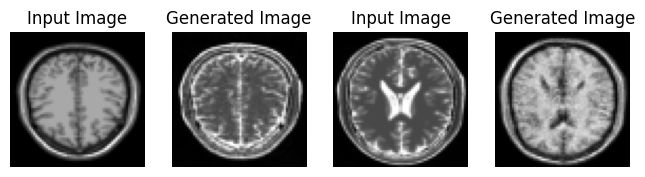

Saving checkpoint for epoch 122 at ./Trained_Model/ckpt-172


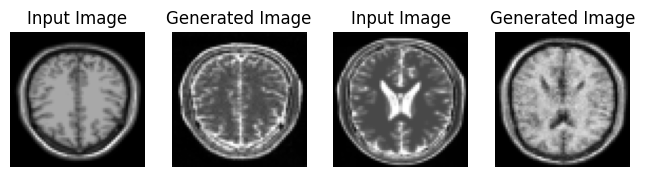

Saving checkpoint for epoch 123 at ./Trained_Model/ckpt-173


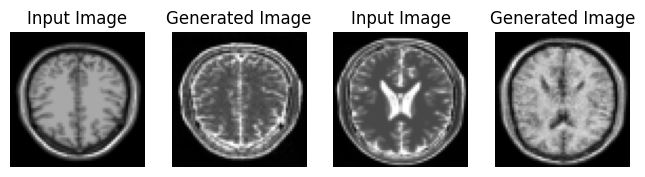

Saving checkpoint for epoch 124 at ./Trained_Model/ckpt-174


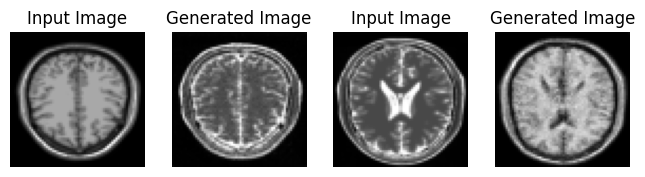

Saving checkpoint for epoch 125 at ./Trained_Model/ckpt-175


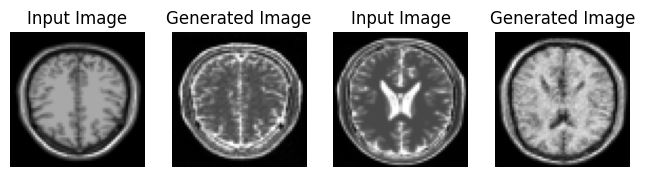

Saving checkpoint for epoch 126 at ./Trained_Model/ckpt-176


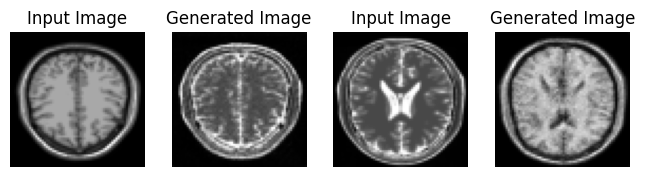

Saving checkpoint for epoch 127 at ./Trained_Model/ckpt-177


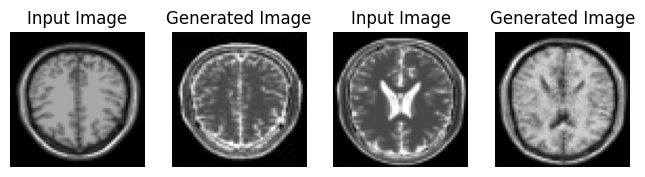

Saving checkpoint for epoch 128 at ./Trained_Model/ckpt-178


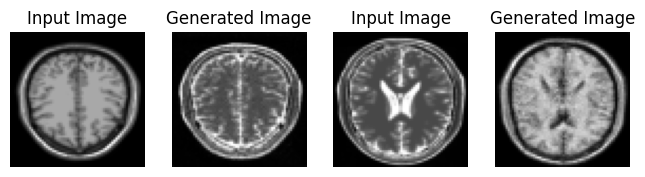

Saving checkpoint for epoch 129 at ./Trained_Model/ckpt-179


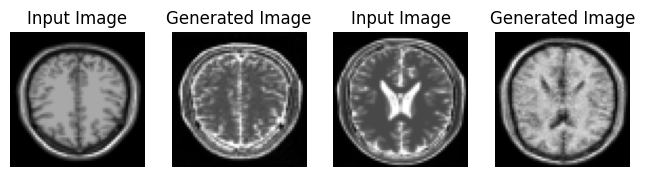

Saving checkpoint for epoch 130 at ./Trained_Model/ckpt-180


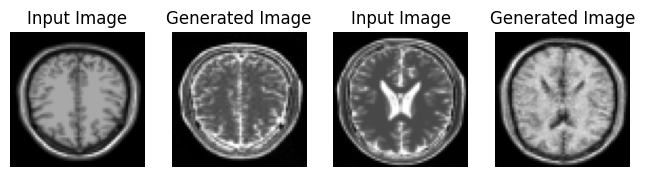

Saving checkpoint for epoch 131 at ./Trained_Model/ckpt-181


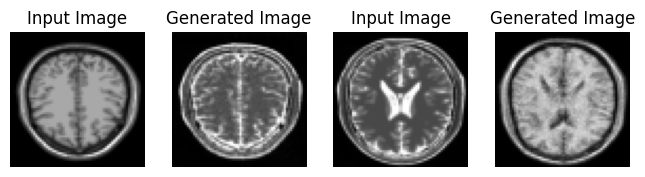

Saving checkpoint for epoch 132 at ./Trained_Model/ckpt-182


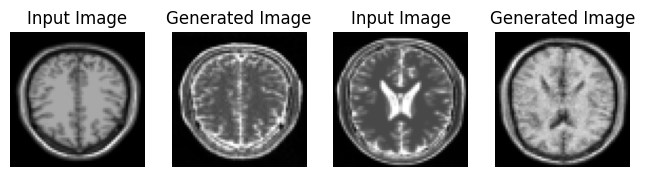

Saving checkpoint for epoch 133 at ./Trained_Model/ckpt-183


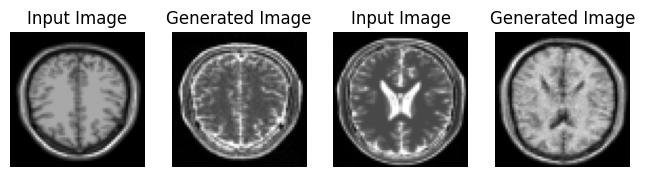

Saving checkpoint for epoch 134 at ./Trained_Model/ckpt-184


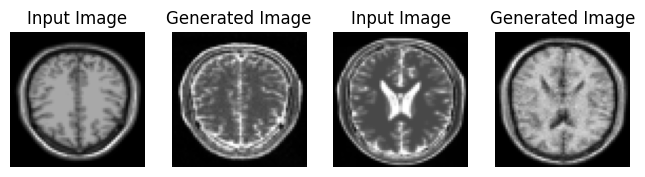

Saving checkpoint for epoch 135 at ./Trained_Model/ckpt-185


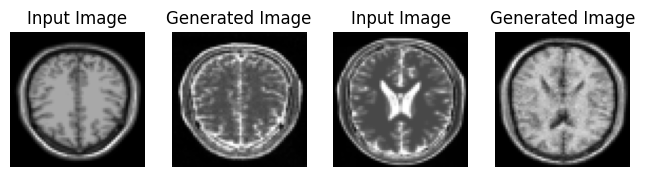

Saving checkpoint for epoch 136 at ./Trained_Model/ckpt-186


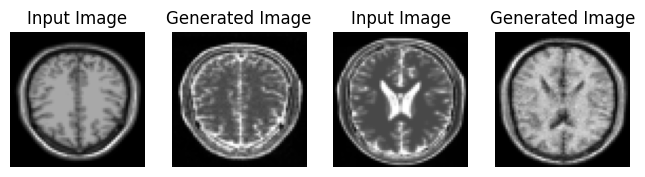

Saving checkpoint for epoch 137 at ./Trained_Model/ckpt-187


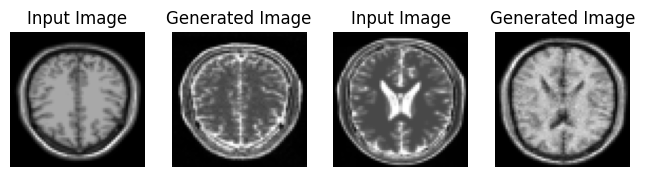

Saving checkpoint for epoch 138 at ./Trained_Model/ckpt-188


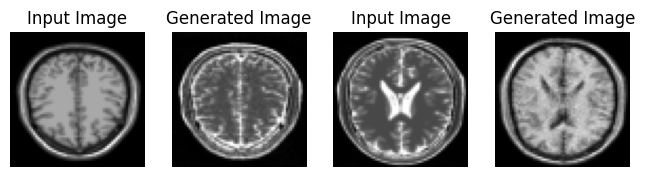

Saving checkpoint for epoch 139 at ./Trained_Model/ckpt-189


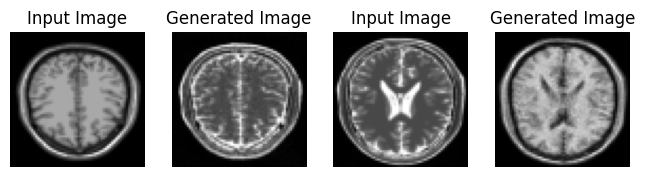

Saving checkpoint for epoch 140 at ./Trained_Model/ckpt-190


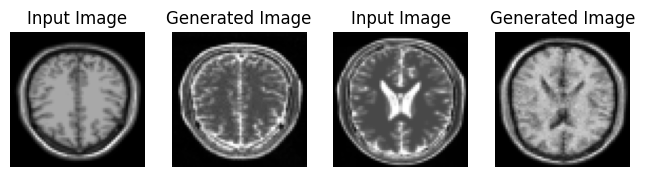

Saving checkpoint for epoch 141 at ./Trained_Model/ckpt-191


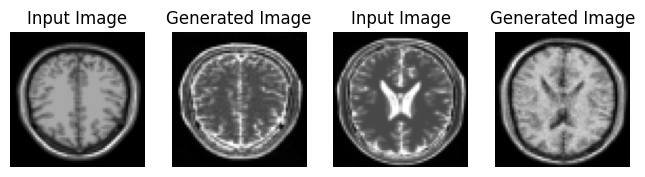

Saving checkpoint for epoch 142 at ./Trained_Model/ckpt-192


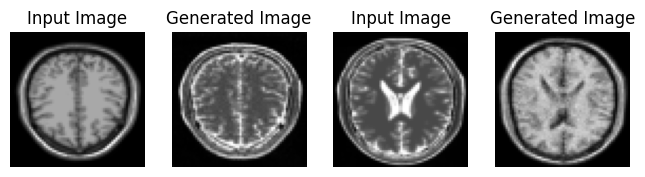

Saving checkpoint for epoch 143 at ./Trained_Model/ckpt-193


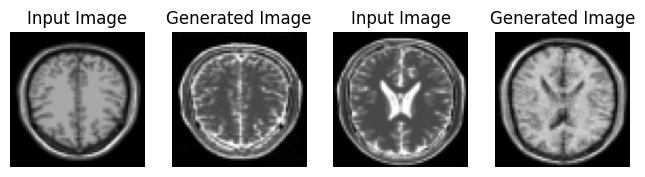

Saving checkpoint for epoch 144 at ./Trained_Model/ckpt-194


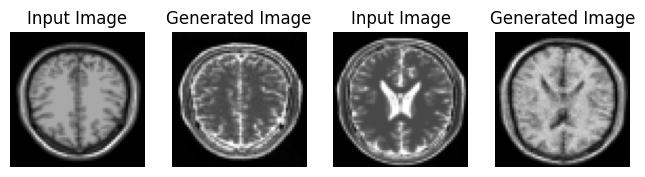

Saving checkpoint for epoch 145 at ./Trained_Model/ckpt-195


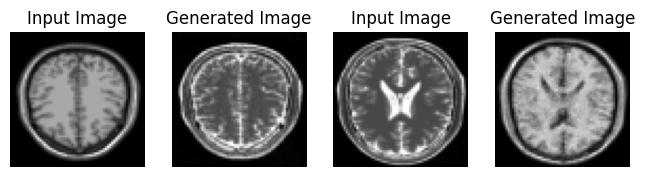

Saving checkpoint for epoch 146 at ./Trained_Model/ckpt-196


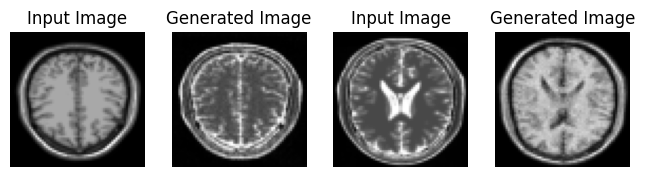

Saving checkpoint for epoch 147 at ./Trained_Model/ckpt-197


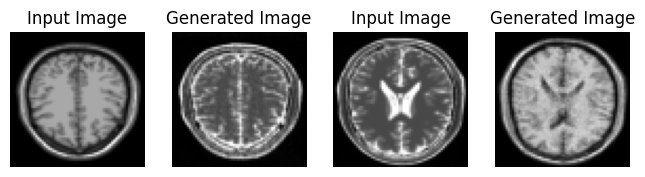

Saving checkpoint for epoch 148 at ./Trained_Model/ckpt-198


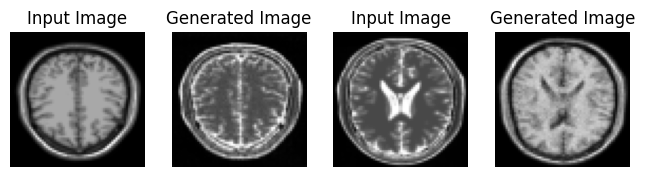

Saving checkpoint for epoch 149 at ./Trained_Model/ckpt-199


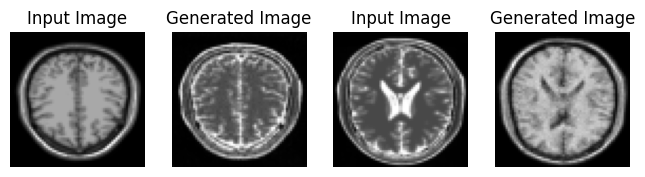

Saving checkpoint for epoch 150 at ./Trained_Model/ckpt-200


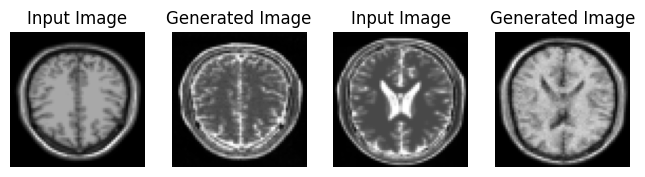

Saving checkpoint for epoch 151 at ./Trained_Model/ckpt-201


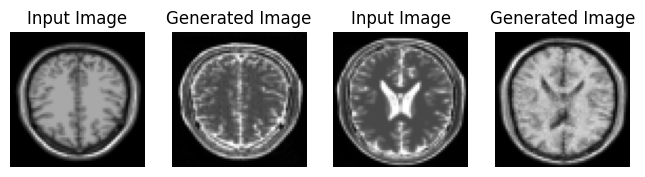

Saving checkpoint for epoch 152 at ./Trained_Model/ckpt-202


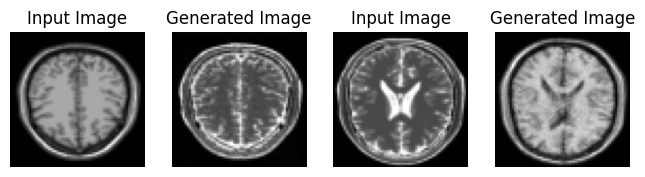

Saving checkpoint for epoch 153 at ./Trained_Model/ckpt-203


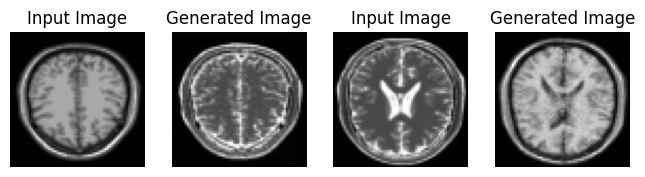

Saving checkpoint for epoch 154 at ./Trained_Model/ckpt-204


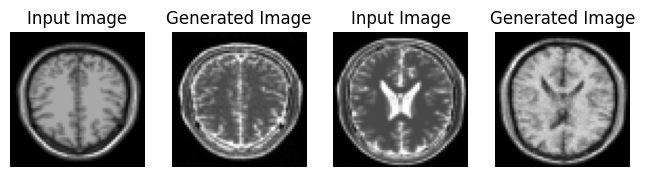

Saving checkpoint for epoch 155 at ./Trained_Model/ckpt-205


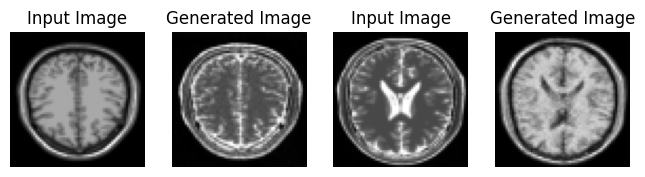

Saving checkpoint for epoch 156 at ./Trained_Model/ckpt-206


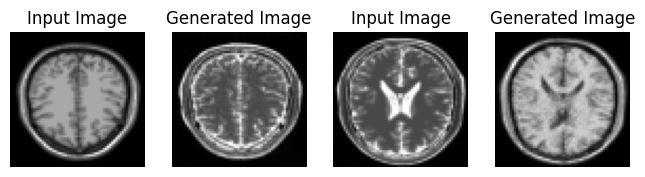

Saving checkpoint for epoch 157 at ./Trained_Model/ckpt-207


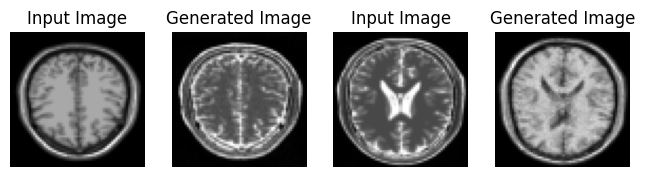

Saving checkpoint for epoch 158 at ./Trained_Model/ckpt-208


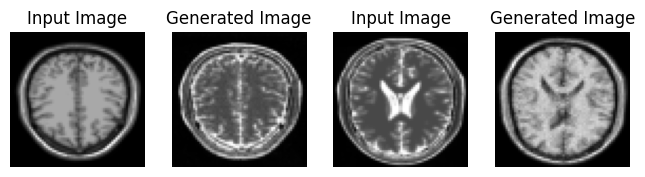

Saving checkpoint for epoch 159 at ./Trained_Model/ckpt-209


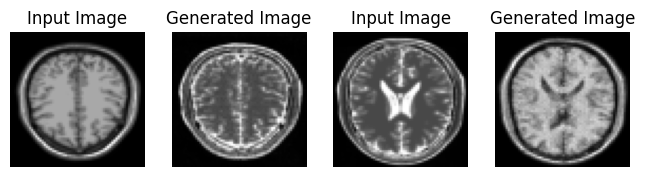

Saving checkpoint for epoch 160 at ./Trained_Model/ckpt-210


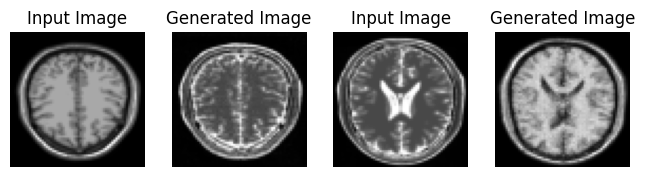

Saving checkpoint for epoch 161 at ./Trained_Model/ckpt-211


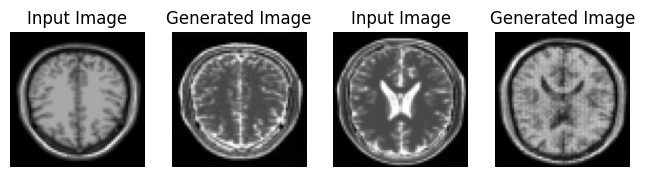

Saving checkpoint for epoch 162 at ./Trained_Model/ckpt-212


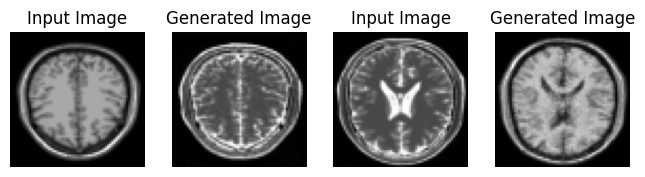

Saving checkpoint for epoch 163 at ./Trained_Model/ckpt-213


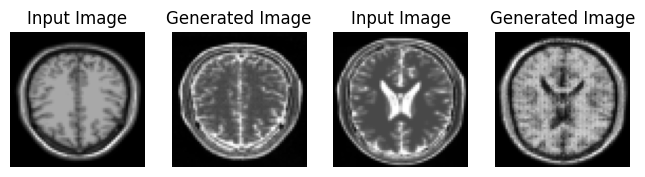

Saving checkpoint for epoch 164 at ./Trained_Model/ckpt-214


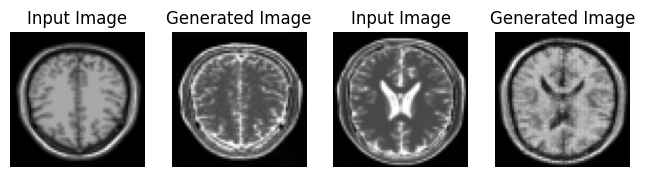

Saving checkpoint for epoch 165 at ./Trained_Model/ckpt-215


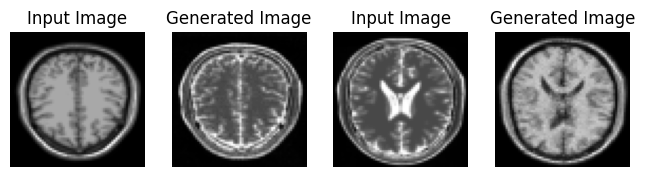

Saving checkpoint for epoch 166 at ./Trained_Model/ckpt-216


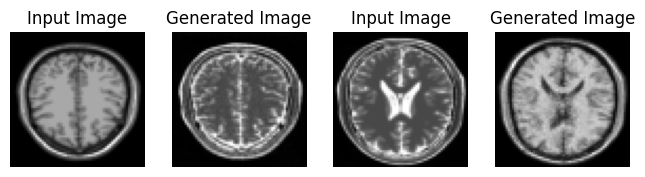

Saving checkpoint for epoch 167 at ./Trained_Model/ckpt-217


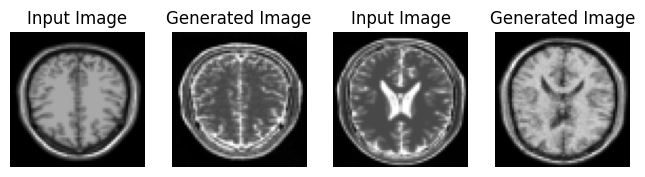

Saving checkpoint for epoch 168 at ./Trained_Model/ckpt-218


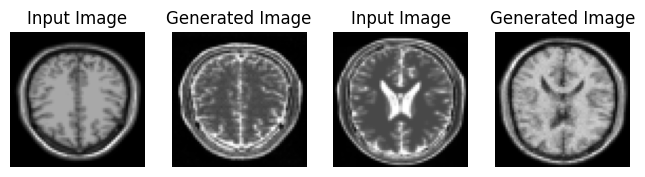

Saving checkpoint for epoch 169 at ./Trained_Model/ckpt-219


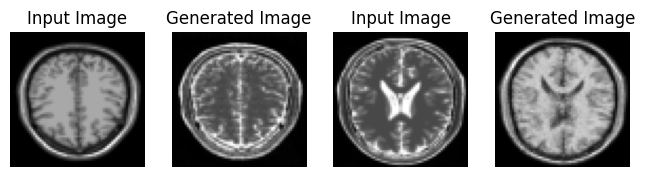

Saving checkpoint for epoch 170 at ./Trained_Model/ckpt-220


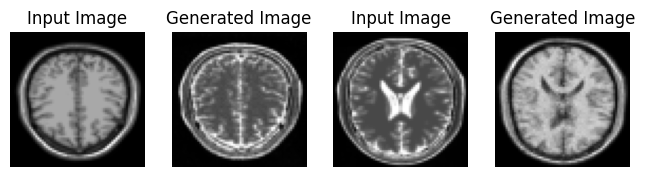

Saving checkpoint for epoch 171 at ./Trained_Model/ckpt-221


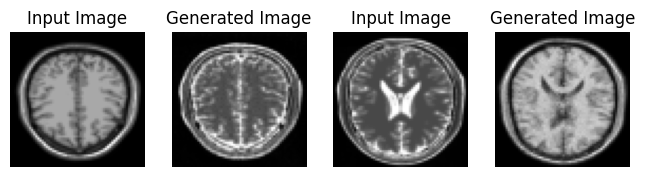

Saving checkpoint for epoch 172 at ./Trained_Model/ckpt-222


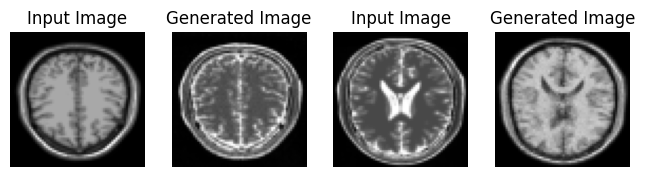

Saving checkpoint for epoch 173 at ./Trained_Model/ckpt-223


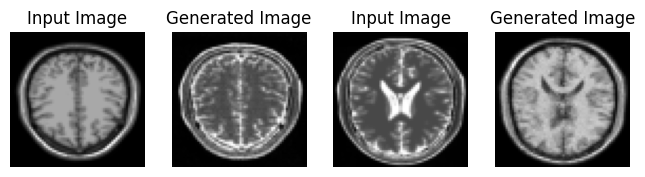

Saving checkpoint for epoch 174 at ./Trained_Model/ckpt-224


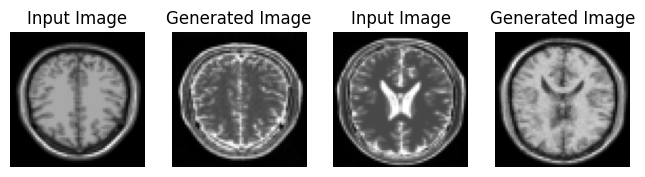

Saving checkpoint for epoch 175 at ./Trained_Model/ckpt-225


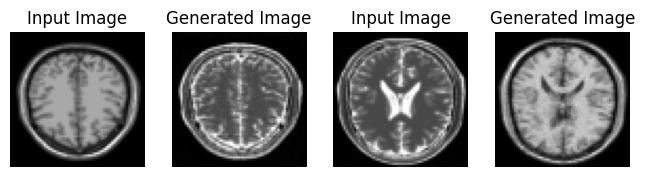

Saving checkpoint for epoch 176 at ./Trained_Model/ckpt-226


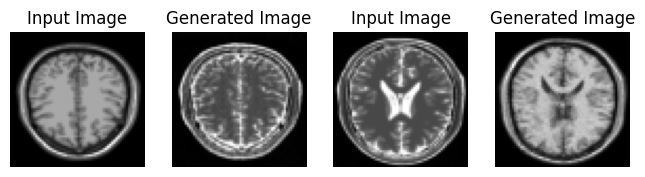

Saving checkpoint for epoch 177 at ./Trained_Model/ckpt-227


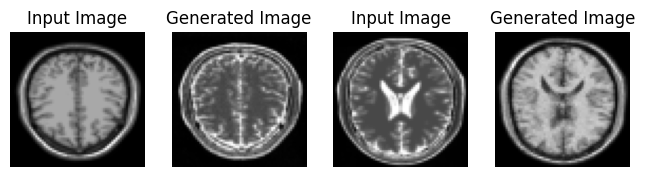

Saving checkpoint for epoch 178 at ./Trained_Model/ckpt-228


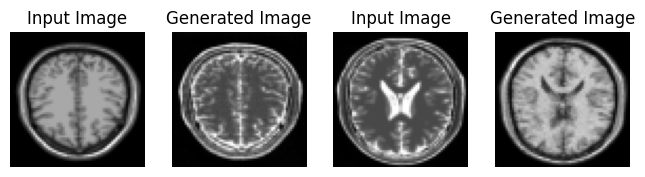

Saving checkpoint for epoch 179 at ./Trained_Model/ckpt-229


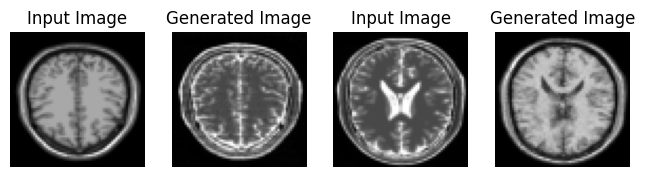

Saving checkpoint for epoch 180 at ./Trained_Model/ckpt-230


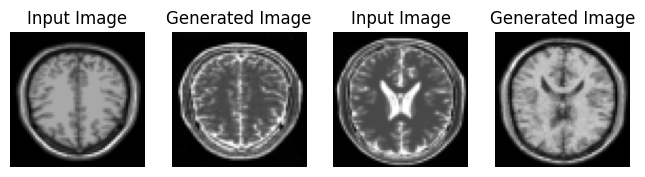

Saving checkpoint for epoch 181 at ./Trained_Model/ckpt-231


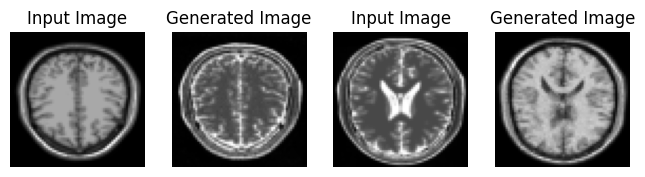

Saving checkpoint for epoch 182 at ./Trained_Model/ckpt-232


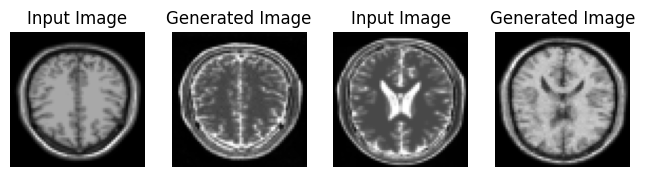

Saving checkpoint for epoch 183 at ./Trained_Model/ckpt-233


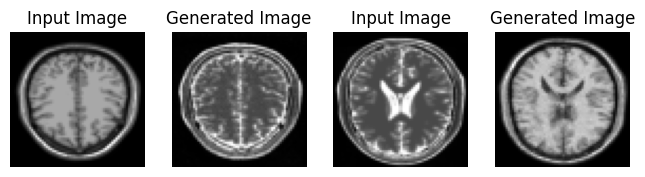

Saving checkpoint for epoch 184 at ./Trained_Model/ckpt-234


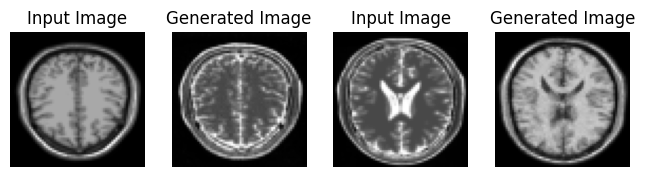

Saving checkpoint for epoch 185 at ./Trained_Model/ckpt-235


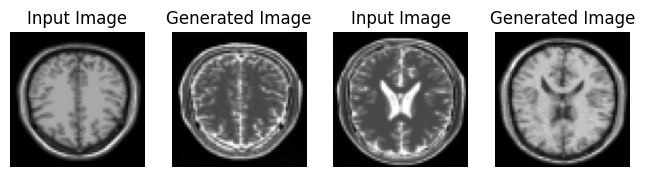

Saving checkpoint for epoch 186 at ./Trained_Model/ckpt-236


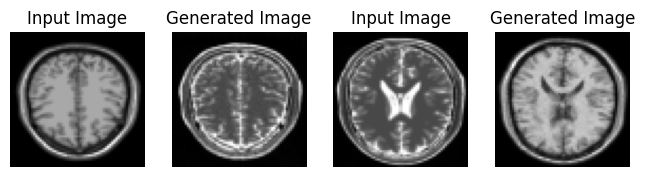

Saving checkpoint for epoch 187 at ./Trained_Model/ckpt-237


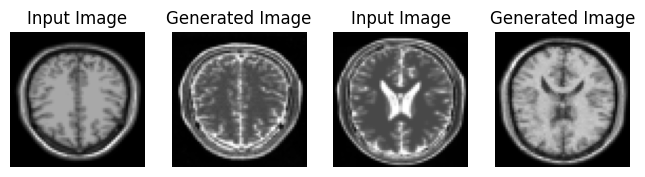

Saving checkpoint for epoch 188 at ./Trained_Model/ckpt-238


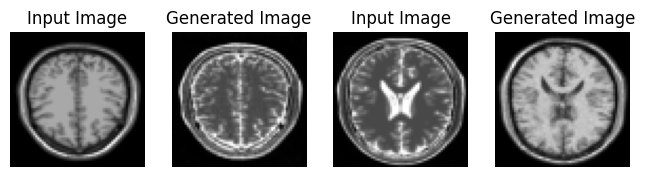

Saving checkpoint for epoch 189 at ./Trained_Model/ckpt-239


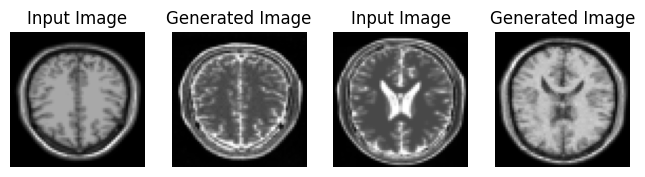

Saving checkpoint for epoch 190 at ./Trained_Model/ckpt-240


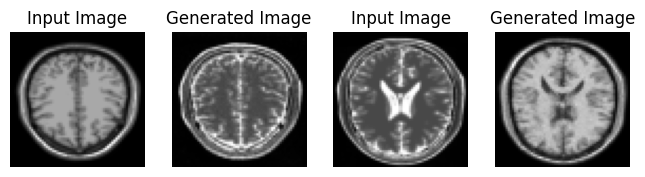

Saving checkpoint for epoch 191 at ./Trained_Model/ckpt-241


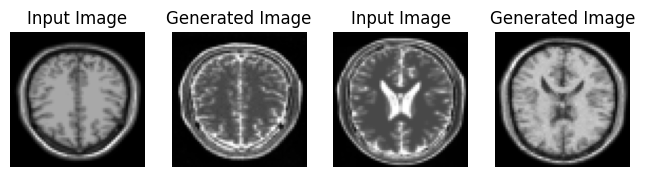

Saving checkpoint for epoch 192 at ./Trained_Model/ckpt-242


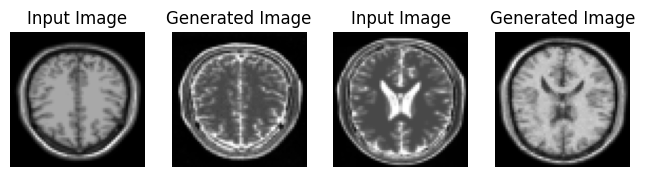

Saving checkpoint for epoch 193 at ./Trained_Model/ckpt-243


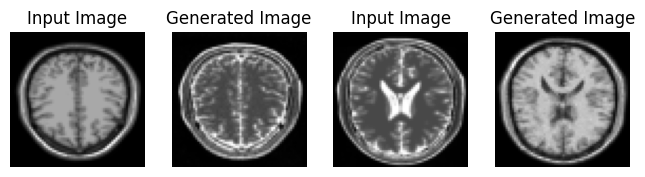

Saving checkpoint for epoch 194 at ./Trained_Model/ckpt-244


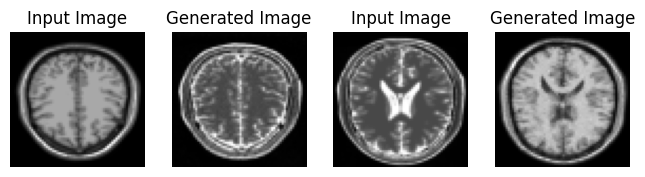

Saving checkpoint for epoch 195 at ./Trained_Model/ckpt-245


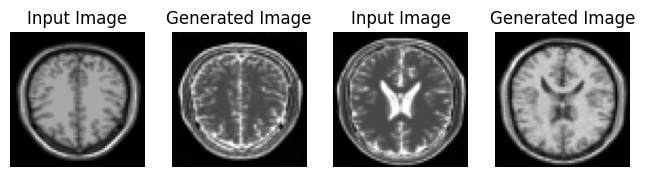

Saving checkpoint for epoch 196 at ./Trained_Model/ckpt-246


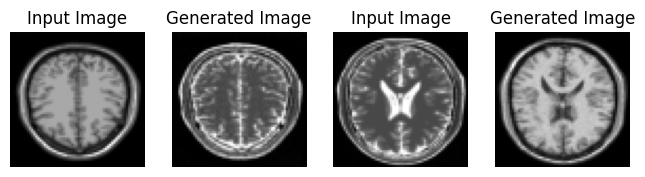

Saving checkpoint for epoch 197 at ./Trained_Model/ckpt-247


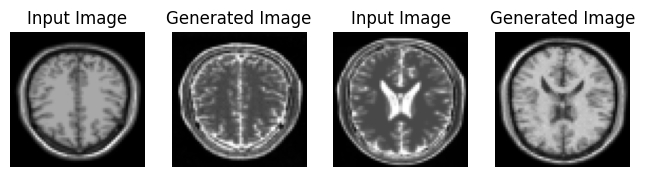

Saving checkpoint for epoch 198 at ./Trained_Model/ckpt-248


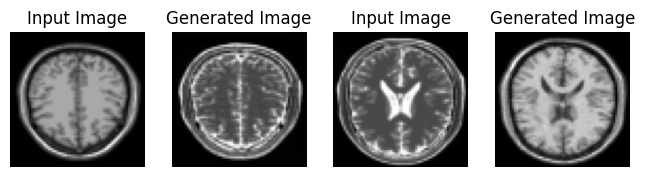

Saving checkpoint for epoch 199 at ./Trained_Model/ckpt-249


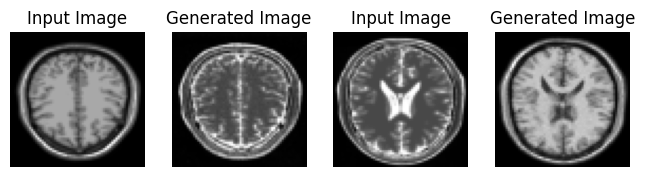

Saving checkpoint for epoch 200 at ./Trained_Model/ckpt-250
CPU times: user 5min 26s, sys: 3min 59s, total: 9min 25s
Wall time: 14min 7s


In [45]:
%%time
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((t1_resized, t2_resized)):
        train_step(image_x, image_y)
    generate_images(generator_g, t1_sample, generator_f, t2_sample)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)